# Load Dataset

In [1]:
!pip install optuna
!pip install catboost
!pip install lightgbm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 5.1 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import optuna
import warnings
import logging

from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize
from scipy.stats import uniform, randint

# Setting display
pd.set_option('display.max_columns', None)
# Setting up seaborn style
sns.set_style("whitegrid")

warnings.simplefilter(action='ignore', category=FutureWarning)

# Load Dataset
from google.colab import files
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df = pd.read_csv('/content/drive/MyDrive/Portofolio/Project/ObesityRisk/Dataset/train.csv')

# Exploritory Data Analysis

In [4]:
df.head()

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


## Statistical Summary

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              20758 non-null  int64  
 1   Gender                          20758 non-null  object 
 2   Age                             20758 non-null  float64
 3   Height                          20758 non-null  float64
 4   Weight                          20758 non-null  float64
 5   family_history_with_overweight  20758 non-null  object 
 6   FAVC                            20758 non-null  object 
 7   FCVC                            20758 non-null  float64
 8   NCP                             20758 non-null  float64
 9   CAEC                            20758 non-null  object 
 10  SMOKE                           20758 non-null  object 
 11  CH2O                            20758 non-null  float64
 12  SCC                             

In [6]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,20758.0,10378.500000,5992.462780,0.00,5189.250000,10378.500000,15567.750000,20757.000000
Age,20758.0,23.841804,5.688072,14.00,20.000000,22.815416,26.000000,61.000000
Height,20758.0,1.700245,0.087312,1.45,1.631856,1.700000,1.762887,1.975663
Weight,20758.0,87.887768,26.379443,39.00,66.000000,84.064875,111.600553,165.057269
FCVC,20758.0,2.445908,0.533218,1.00,2.000000,2.393837,3.000000,3.000000
NCP,20758.0,2.761332,0.705375,1.00,3.000000,3.000000,3.000000,4.000000
CH2O,20758.0,2.029418,0.608467,1.00,1.792022,2.000000,2.549617,3.000000
FAF,20758.0,0.981747,0.838302,0.00,0.008013,1.000000,1.587406,3.000000
TUE,20758.0,0.616756,0.602113,0.00,0.000000,0.573887,1.000000,2.000000


In [7]:
df.describe(include=['O']).transpose()

,count,unique,top,freq
Gender,20758,2,Female,10422
family_history_with_overweight,20758,2,yes,17014
FAVC,20758,2,yes,18982
CAEC,20758,4,Sometimes,17529
SMOKE,20758,2,no,20513
SCC,20758,2,no,20071
CALC,20758,3,Sometimes,15066
MTRANS,20758,5,Public_Transportation,16687
NObeyesdad,20758,7,Obesity_Type_III,4046


In [8]:
# Cheking Null Value
null_values = df.isnull().sum()
columns_with_null = null_values[null_values > 0]
print(columns_with_null)

Series([], dtype: int64)


In [9]:
# Checking Duplicated Value
df.duplicated().sum()

0

**Conclusion**
- The Training Dataset consists of 18 columns and 20,758 rows of data.
- The columns 'Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS', and 'NObeyesdad' are of object data type.
- The columns 'Gender', 'family_history_with_overweight', 'FAVC', 'SMOKE', and 'SCC' are binary columns, which contain binary values for specific categories.
- The columns 'id', 'Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', and 'TUE' are of numeric data type, containing numerical values for specific attributes.
- There are no null values or duplicate data in the dataset.

## Univariate Analysis

In [10]:
# Identify numeric and categorical columns based on column headings
numerical_columns = df.select_dtypes(include=['number']).drop(columns=['id'])
categorical_columns = df.select_dtypes(include=['object'])

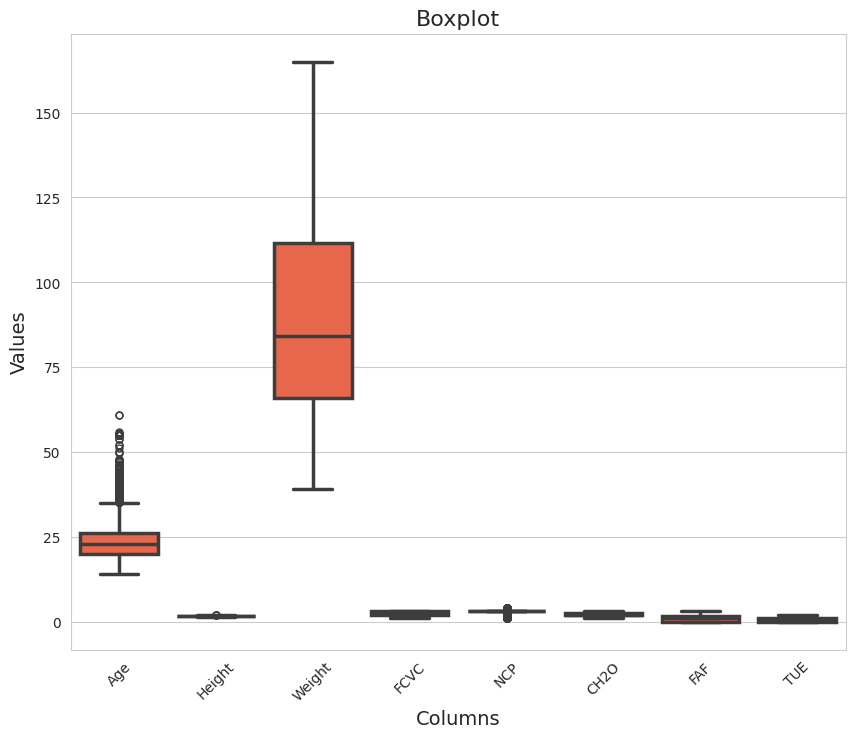

In [11]:
# Creating a boxplot using seaborn with custom color
plt.figure(figsize=(10, 8))
sns.boxplot(data=numerical_columns, color='#FF5733', linewidth=2.5, fliersize=5)
plt.title('Boxplot', fontsize=16)
plt.xlabel('Columns', fontsize=14)
plt.ylabel('Values', fontsize=14)
plt.xticks(rotation=45)
plt.show()

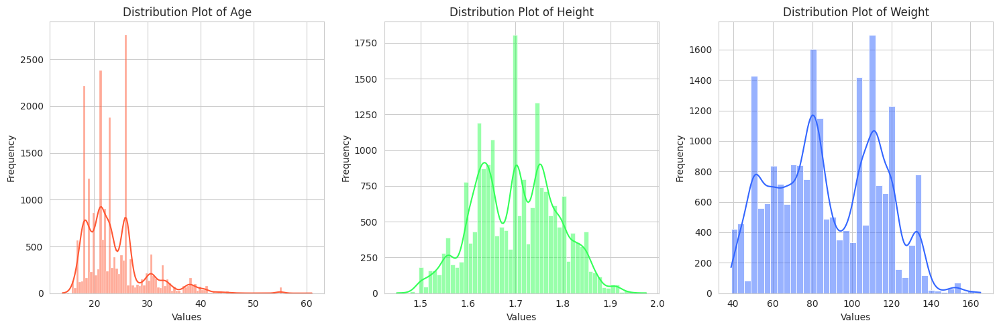

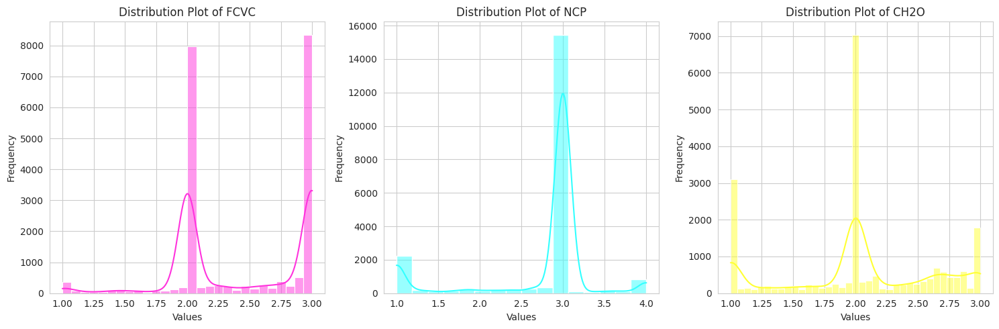

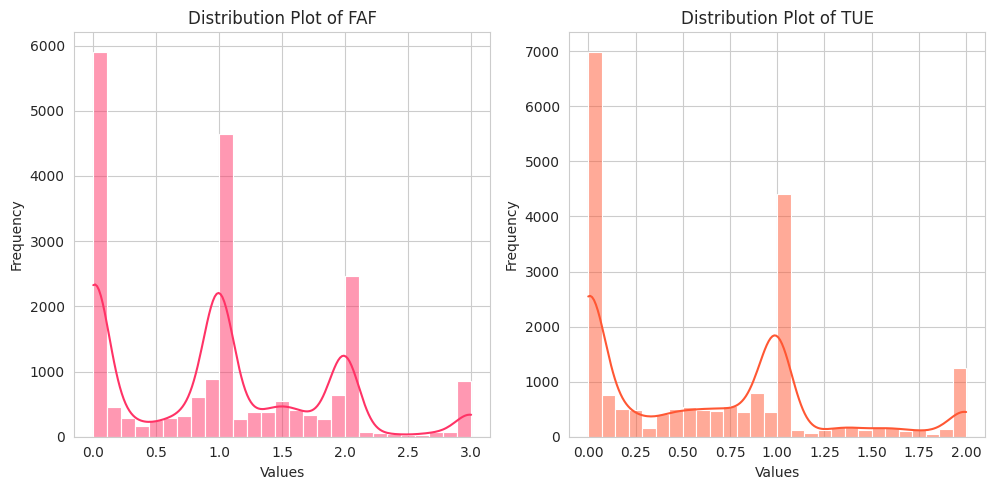

In [12]:
# Created Displot from numerical columns
colors = ['#FF5733', '#33FF57', '#3366FF', '#FF33DD', '#33FFFF', '#FFFF33', '#FF3366']

for i, column in enumerate(numerical_columns.columns):
    if i % 3 == 0:
        plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, i % 3 + 1)
    sns.histplot(data=numerical_columns[column], kde=True, color=colors[i % len(colors)])
    plt.title(f'Distribution Plot of {column}', fontsize=12)
    plt.xlabel('Values', fontsize=10)
    plt.ylabel('Frequency', fontsize=10)
    if i % 3 == 2 or i == len(numerical_columns.columns) - 1:
        plt.tight_layout()
        plt.show()

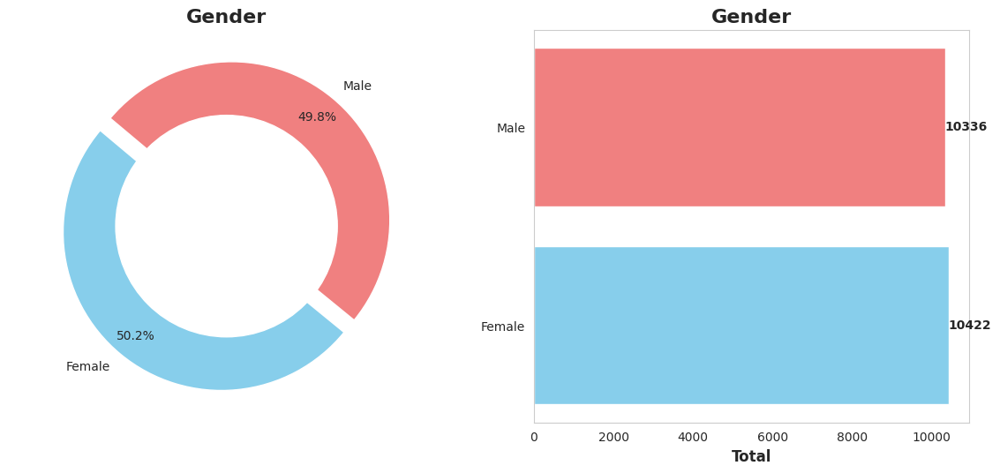

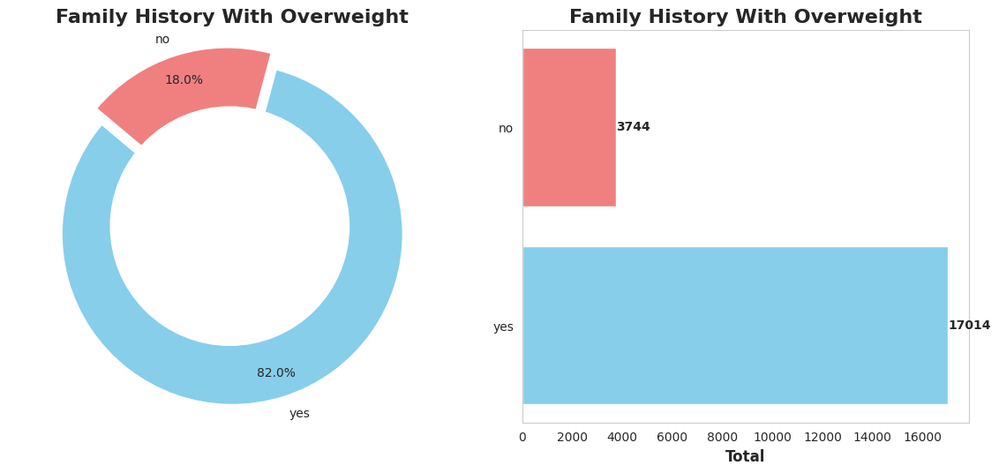

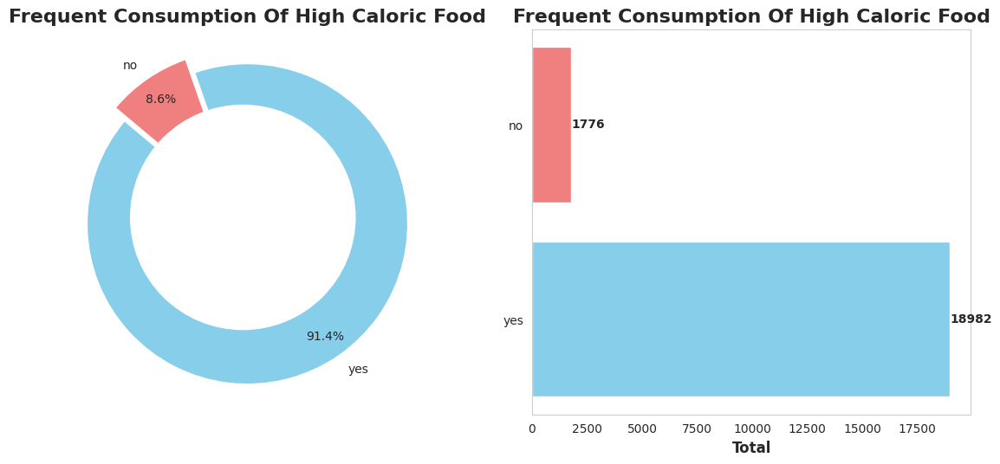

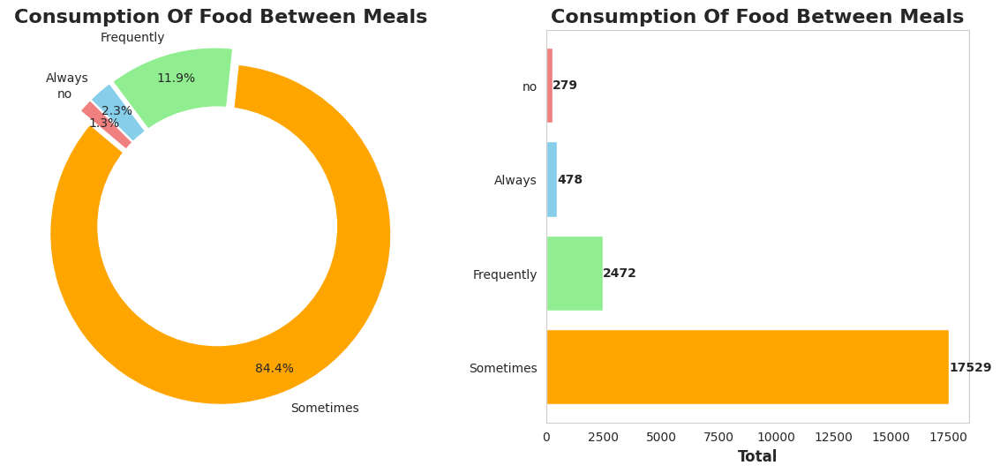

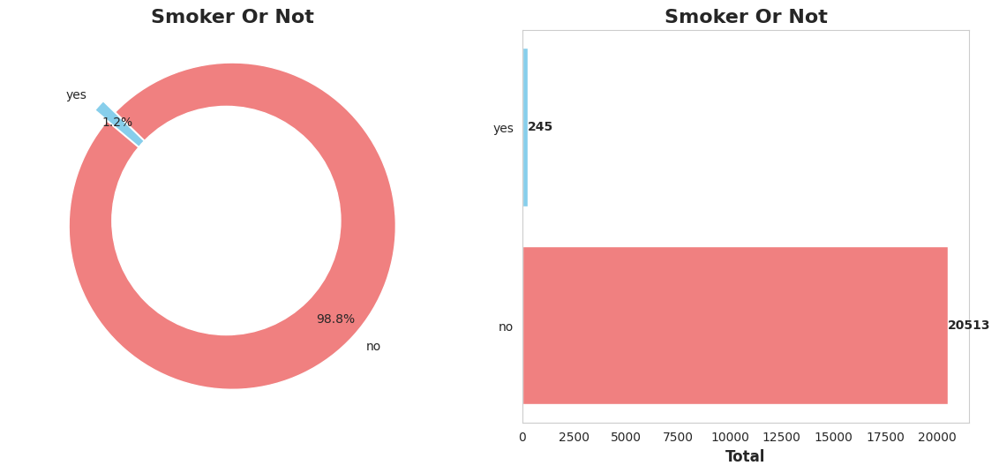

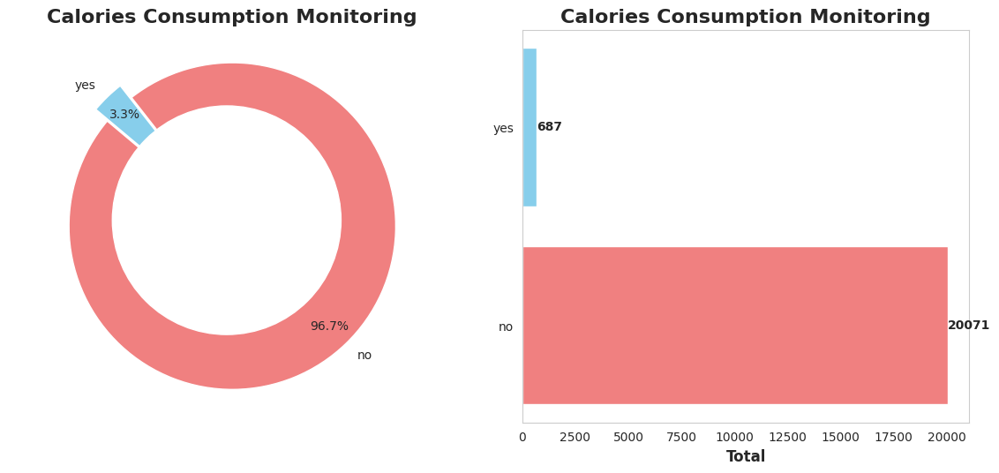

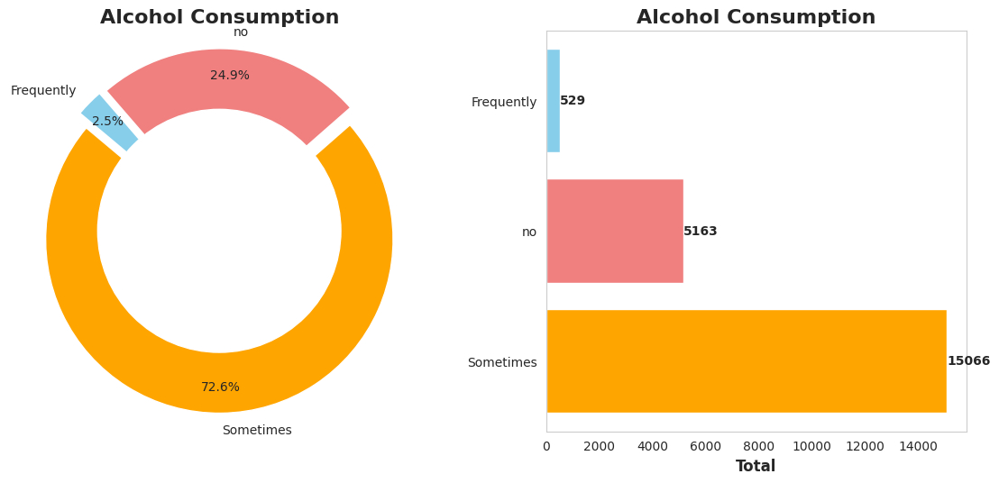

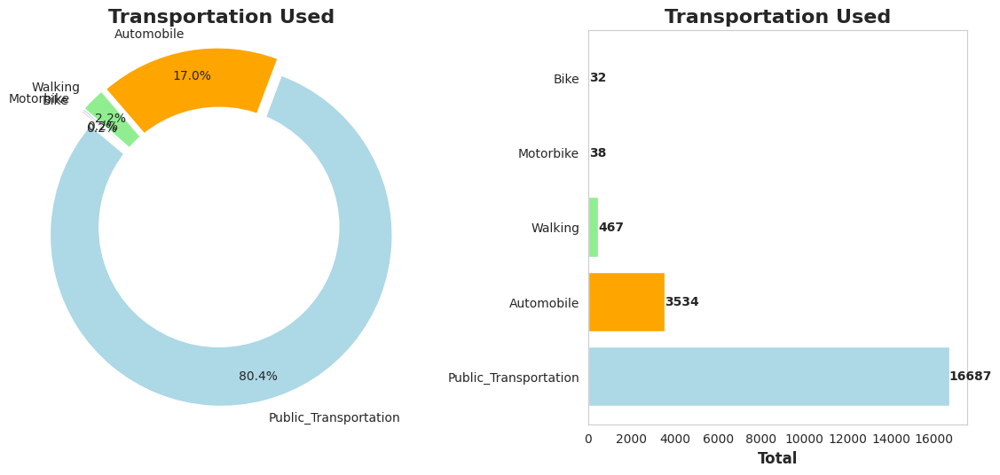

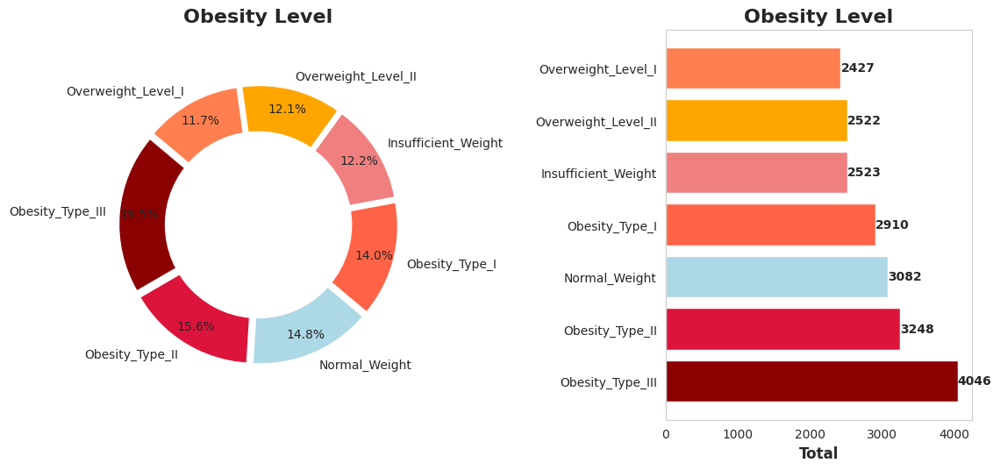

In [13]:
# List of plot codes
plot_codes = [
    # Gender
    {
        'data': df['Gender'].value_counts(),
        'colors': {'Male': 'lightcoral', 'Female': 'skyblue'},
        'title': 'Gender'
    },
    # family_history_with_overweight
    {
        'data': df['family_history_with_overweight'].value_counts(),
        'colors': {'no': 'lightcoral', 'yes': 'skyblue'},
        'title': 'Family History With Overweight'
    },
    # FAVC
    {
        'data': df['FAVC'].value_counts(),
        'colors': {'no': 'lightcoral', 'yes': 'skyblue'},
        'title': 'Frequent Consumption Of High Caloric Food'
    },
    # CAEC
    {
        'data': df['CAEC'].value_counts(),
        'colors': {'no': 'lightcoral', 'Always': 'skyblue', 'Frequently': 'lightgreen', 'Sometimes' : 'orange'},
        'title': 'Consumption Of Food Between Meals'
    },
    # SMOKE
    {
        'data': df['SMOKE'].value_counts(),
        'colors': {'no': 'lightcoral', 'yes': 'skyblue'},
        'title': 'Smoker Or Not'
    },
    # SCC
    {
        'data': df['SCC'].value_counts(),
        'colors': {'no': 'lightcoral', 'yes': 'skyblue'},
        'title': 'Calories Consumption Monitoring'
    },
    # CALC
    {
        'data': df['CALC'].value_counts(),
        'colors': {'no': 'lightcoral', 'Frequently': 'skyblue', 'Sometimes' : 'orange'},
        'title': 'Alcohol Consumption'
    },
    # MTRANS
    {
        'data': df['MTRANS'].value_counts(),
        'colors': {'Bike': 'lightcoral', 'Motorbike': 'skyblue', 'Walking': 'lightgreen', 'Automobile': 'orange', 'Public_Transportation': 'lightblue'},
        'title': 'Transportation Used'
    },
    # NObeyesdad
    {
        'data': df['NObeyesdad'].value_counts(),
        'colors': {'Obesity_Type_III': 'darkred', 'Obesity_Type_II': 'crimson', 'Obesity_Type_I': 'tomato', 'Normal_Weight': 'lightblue', 'Insufficient_Weight': 'lightcoral', 'Overweight_Level_II': 'orange', 'Overweight_Level_I': 'coral'},
        'title': 'Obesity Level'
    }
]

# Loop to create plots
for i, code in enumerate(plot_codes):
    # Plot
    plt.figure(figsize=(12, 6))

    # Donut Plot
    plt.subplot(1, 2, 1)
    explode = [0.05] * len(code['data'])
    plt.pie(code['data'], labels=code['data'].index, autopct='%1.1f%%', startangle=140, colors=[code['colors'][g] for g in code['data'].index], explode=explode, pctdistance=0.85)
    plt.title(code['title'], fontsize=16, fontweight='bold')
    plt.axis('equal')
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.grid(False)

    # Bar Plot
    plt.subplot(1, 2, 2)
    plt.barh(code['data'].index, code['data'].values, color=[code['colors'][g] for g in code['data'].index])
    for index, value in enumerate(code['data'].values):
        plt.text(value, index, str(value), ha='left', va='center', fontsize=10, fontweight='bold')  # Bold all text
    plt.title(code['title'], fontsize=16, fontweight='bold')
    plt.xlabel('Total', fontsize=12, fontweight='bold')
    plt.grid(False)

    # Adjust layout
    plt.tight_layout(pad=3.0)

    # Show plot
    plt.show()

**Conclusion**
-	Proper handling of outliers is necessary because there are values far from the general data distribution.
-	The distribution of height and weight data shows a tendency towards a normal distribution, allowing for the application of appropriate analytical methods.
-	The gender balance in the dataset shows a relatively balanced distribution, allowing for unbiased analysis of gender.
-	82% of respondents reported having a family history of overweight, indicating genetic or environmental factors that may influence.
-	91.4% of respondents reported consuming high-calorie foods, indicating a trend of dietary behavior that needs attention.
-	84.4% of respondents reported occasionally consuming food outside meal times, indicating irregular eating habits.
-	98.8% of respondents reported being non-smokers, indicating a preference for healthy lifestyle habits.
-	96.7% of respondents reported not monitoring calorie intake, indicating a lack of awareness of daily nutritional intake.
-	75.1% of respondents reported consuming alcohol, indicating a tendency towards risky health behaviors.
-	97.4% of respondents reported choosing to use motorized vehicles for travel, indicating a preference for practical mobility.
-	There is an imbalance in the number of the target variable, requiring special handling to address class imbalance in data analysis.


## Multivariate Analysis

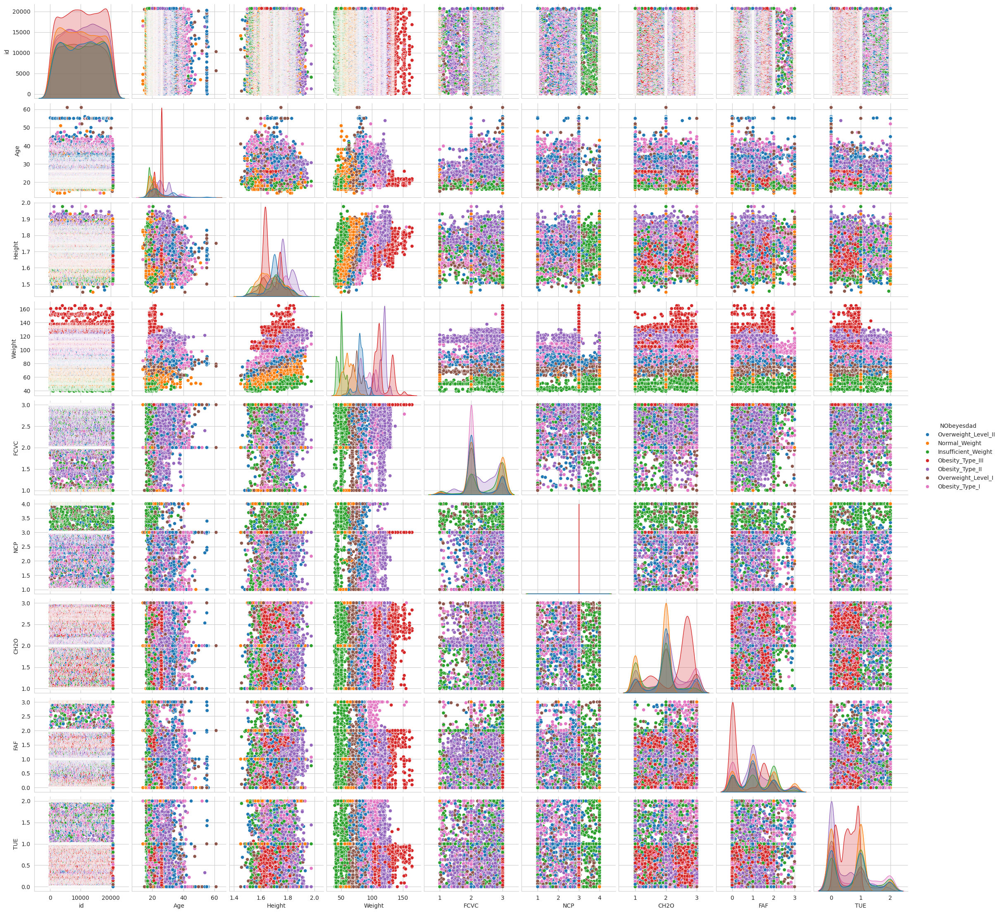

In [14]:
sns.pairplot(df, diag_kind='kde', hue='NObeyesdad')

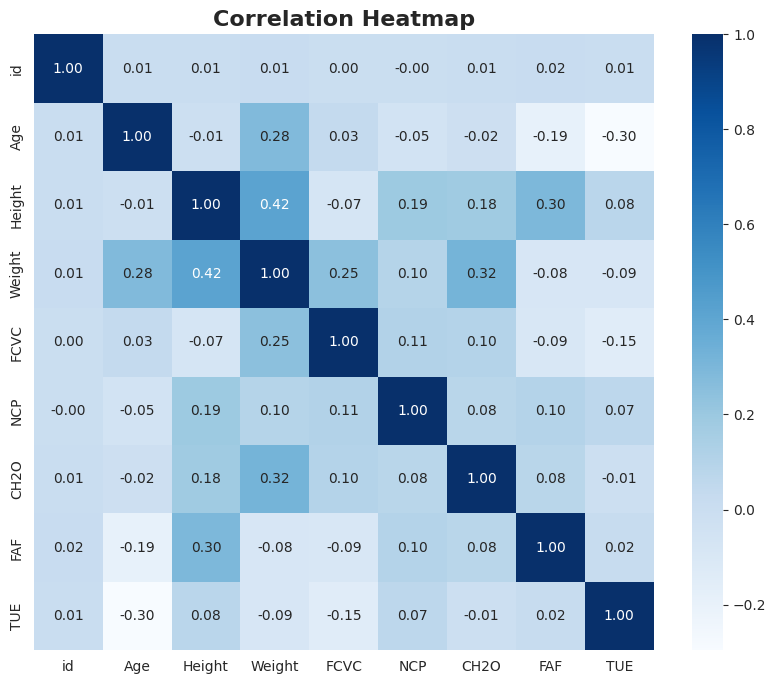

In [15]:
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), cmap='Blues', annot=True, fmt='.2f')
plt.title('Correlation Heatmap', fontsize=16, fontweight='bold')
plt.show()

In [16]:
# List of numerical columns to calculate mean
numerical_columns = ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']

# Loop to calculate mean for each numerical column grouped by 'NObeyesdad'
for column in numerical_columns:
    grouped_data = df.groupby('NObeyesdad')[column].mean().reset_index()
    print(f"Average {column} for each 'NObeyesdad':")
    print(grouped_data)
    print()

Average Age for each 'NObeyesdad':
            NObeyesdad        Age
0  Insufficient_Weight  19.336502
1        Normal_Weight  20.801388
2       Obesity_Type_I  25.023615
3      Obesity_Type_II  27.707128
4     Obesity_Type_III  24.126847
5   Overweight_Level_I  23.045197
6  Overweight_Level_II  26.032084

Average Height for each 'NObeyesdad':
            NObeyesdad    Height
0  Insufficient_Weight  1.683693
1        Normal_Weight  1.670744
2       Obesity_Type_I  1.693509
3      Obesity_Type_II  1.782715
4     Obesity_Type_III  1.676007
5   Overweight_Level_I  1.686880
6  Overweight_Level_II  1.706163

Average Weight for each 'NObeyesdad':
            NObeyesdad      Weight
0  Insufficient_Weight   49.860773
1        Normal_Weight   61.533289
2       Obesity_Type_I   92.371026
3      Obesity_Type_II  115.995914
4     Obesity_Type_III  117.697452
5   Overweight_Level_I   74.228266
6  Overweight_Level_II   82.085513

Average FCVC for each 'NObeyesdad':
            NObeyesdad      FCVC
0

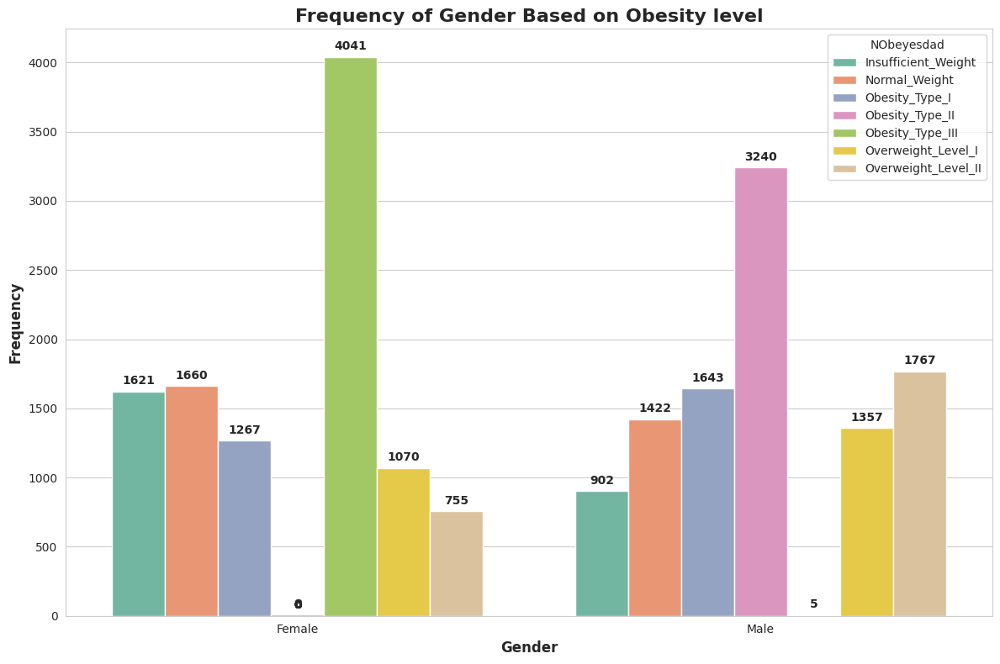

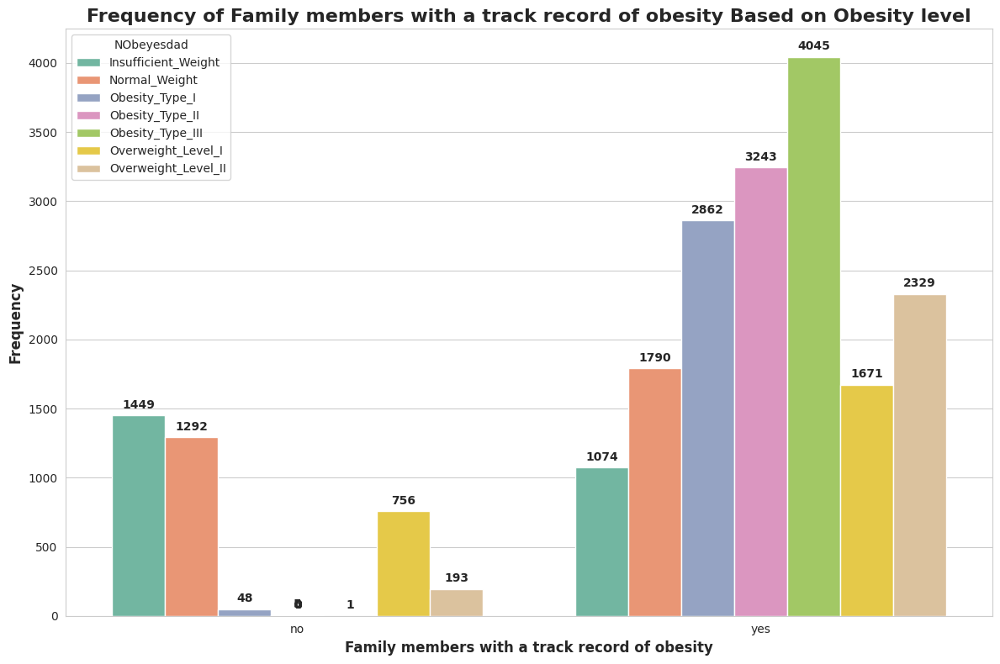

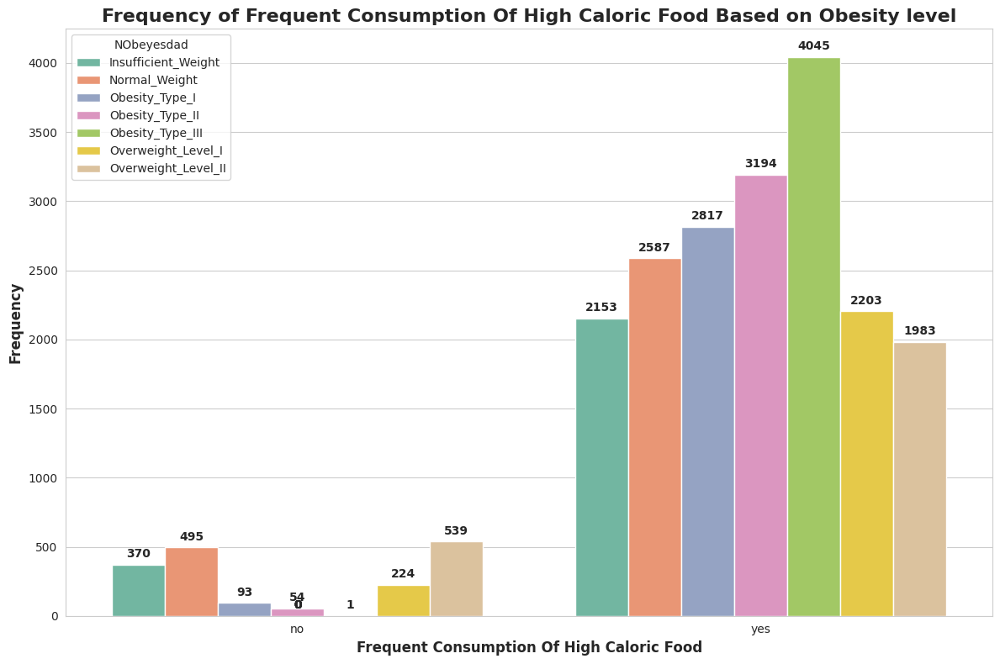

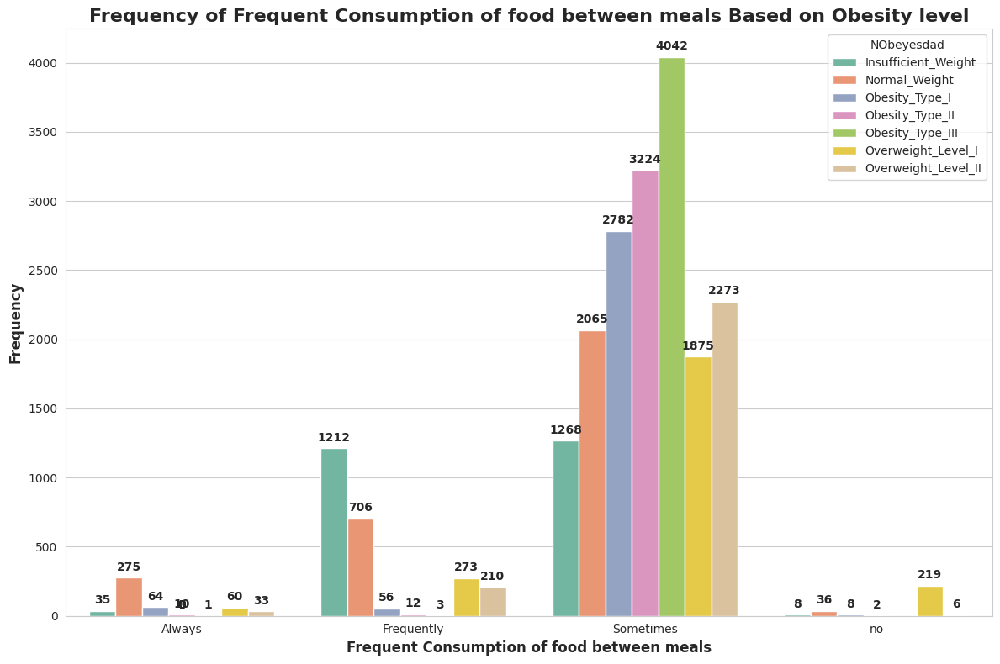

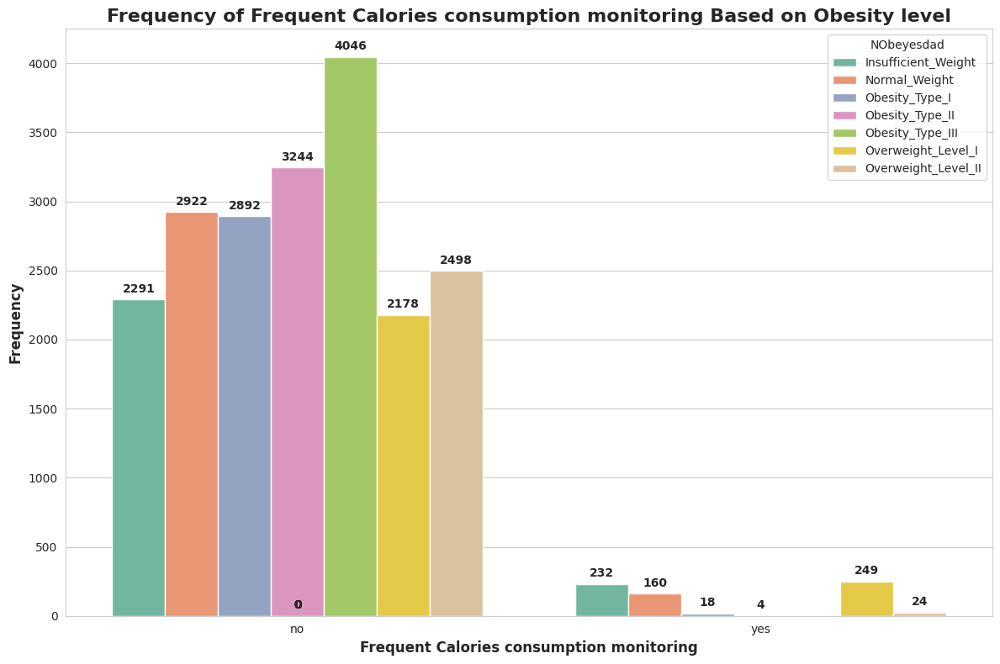

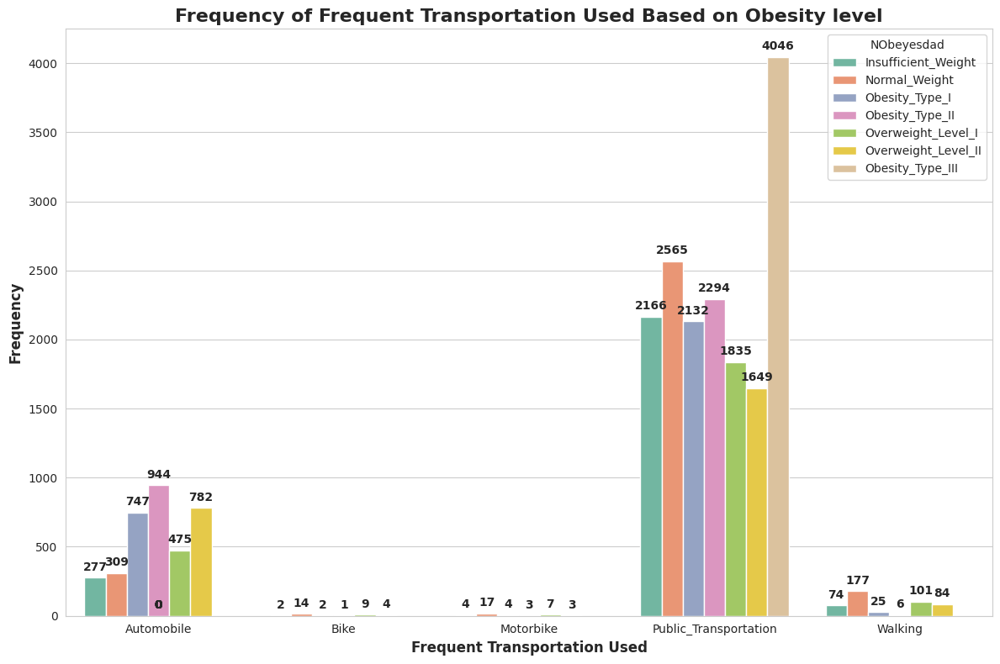

In [17]:
# List of column combinations to calculate frequency
column_combinations = [('Gender', 'Gender'), ('family_history_with_overweight', 'Family members with a track record of obesity'),
                       ('FAVC', 'Frequent Consumption Of High Caloric Food'), ('CAEC', 'Frequent Consumption of food between meals'),
                       ('SCC', 'Frequent Calories consumption monitoring'), ('MTRANS', 'Frequent Transportation Used')]

# Loop to calculate frequency and create plots for each column combination
for column, column_name in column_combinations:
    grouped_data = df.groupby([column, 'NObeyesdad']).size().reset_index(name='Frequency')

    plt.figure(figsize=(12, 8))
    ax = sns.barplot(x=column, y='Frequency', hue='NObeyesdad', data=grouped_data, palette='Set2')
    plt.title(f'Frequency of {column_name} Based on Obesity level', fontsize=16, fontweight='bold')
    plt.xlabel(column_name, fontsize=12, fontweight='bold')
    plt.ylabel('Frequency', fontsize=12, fontweight='bold')
    plt.legend(title='NObeyesdad')

    # Add numbers at the end of each bar
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'),
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center',
                    xytext=(0, 9),
                    textcoords='offset points',
                    fontsize=10, fontweight='bold')

    plt.tight_layout()
    plt.show()

**Conclusion**
-	The average weight of individuals with obesity is higher compared to other classes.
-	Individuals with obesity types II and III tend to have higher main food intake compared to other classes.
-	Females have a higher risk of experiencing type III obesity, while males have a higher risk of type II obesity.
-	The average water consumption of individuals with overweight and obesity is higher compared to those with normal weight.
-	Individuals with obesity and overweight tend to engage less in physical activity.
-	Individuals with a family history of overweight have a greater potential to experience obesity.
-	Consuming high-calorie foods increases the potential for obesity compared to consuming low-calorie foods.
-	Consuming food outside meal times increases the risk of obesity.
-	Not monitoring calorie intake increases the risk of obesity.
-	Individuals who rarely move (walk or bike) have a lower risk of obesity.


# Data Pre-Processing

In [18]:
df_test = df.drop(columns=['id'])
df_test.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


## Feature Encoding

In [19]:
# Columns that need to be labeled with encoding
binary_columns = ['family_history_with_overweight', 'FAVC', 'SMOKE', 'SCC', 'CAEC', 'CALC']

# Create a LabelEncoder object
label_encoder = LabelEncoder()

# Perform label encoding for each binary column
for column in binary_columns:
    df_test[column] = label_encoder.fit_transform(df_test[column])
df_test.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Male,24.443011,1.699998,81.669950,1,1,2.000000,2.983297,2,0,2.763573,0,0.000000,0.976473,1,Public_Transportation,Overweight_Level_II
1,Female,18.000000,1.560000,57.000000,1,1,2.000000,3.000000,1,0,2.000000,0,1.000000,1.000000,2,Automobile,Normal_Weight
2,Female,18.000000,1.711460,50.165754,1,1,1.880534,1.411685,2,0,1.910378,0,0.866045,1.673584,2,Public_Transportation,Insufficient_Weight
3,Female,20.952737,1.710730,131.274851,1,1,3.000000,3.000000,2,0,1.674061,0,1.467863,0.780199,1,Public_Transportation,Obesity_Type_III
4,Male,31.641081,1.914186,93.798055,1,1,2.679664,1.971472,2,0,1.979848,0,1.967973,0.931721,1,Public_Transportation,Overweight_Level_II


In [20]:
# Columns that will be one-hot encoding
columns_to_encode = ['Gender','MTRANS']

# Perform one-hot encoding for these columns
df_test = pd.get_dummies(df_test, columns=columns_to_encode)
df_test.head()

,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,NObeyesdad,Gender_Female,Gender_Male,MTRANS_Automobile,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
0,24.443011,1.699998,81.669950,1,1,2.000000,2.983297,2,0,2.763573,0,0.000000,0.976473,1,Overweight_Level_II,0,1,0,0,0,1,0
1,18.000000,1.560000,57.000000,1,1,2.000000,3.000000,1,0,2.000000,0,1.000000,1.000000,2,Normal_Weight,1,0,1,0,0,0,0
2,18.000000,1.711460,50.165754,1,1,1.880534,1.411685,2,0,1.910378,0,0.866045,1.673584,2,Insufficient_Weight,1,0,0,0,0,1,0
3,20.952737,1.710730,131.274851,1,1,3.000000,3.000000,2,0,1.674061,0,1.467863,0.780199,1,Obesity_Type_III,1,0,0,0,0,1,0
4,31.641081,1.914186,93.798055,1,1,2.679664,1.971472,2,0,1.979848,0,1.967973,0.931721,1,Overweight_Level_II,0,1,0,0,0,1,0


In [21]:
# A dictionary that maps new values ​​to each target value
target_mapping = {
    'Insufficient_Weight': 0,
    'Normal_Weight': 1,
    'Obesity_Type_I': 2,
    'Obesity_Type_II': 3,
    'Obesity_Type_III': 4,
    'Overweight_Level_I': 5,
    'Overweight_Level_II': 6
}

# Use the map method to change the values ​​in the target column
df_test['NObeyesdad'] = df_test['NObeyesdad'].map(target_mapping)
df_test.head()

,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,NObeyesdad,Gender_Female,Gender_Male,MTRANS_Automobile,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
0,24.443011,1.699998,81.669950,1,1,2.000000,2.983297,2,0,2.763573,0,0.000000,0.976473,1,6,0,1,0,0,0,1,0
1,18.000000,1.560000,57.000000,1,1,2.000000,3.000000,1,0,2.000000,0,1.000000,1.000000,2,1,1,0,1,0,0,0,0
2,18.000000,1.711460,50.165754,1,1,1.880534,1.411685,2,0,1.910378,0,0.866045,1.673584,2,0,1,0,0,0,0,1,0
3,20.952737,1.710730,131.274851,1,1,3.000000,3.000000,2,0,1.674061,0,1.467863,0.780199,1,4,1,0,0,0,0,1,0
4,31.641081,1.914186,93.798055,1,1,2.679664,1.971472,2,0,1.979848,0,1.967973,0.931721,1,6,0,1,0,0,0,1,0


In [22]:
# Separate features and targets
X = df_test.drop(columns=['NObeyesdad'])
y = df_test['NObeyesdad']

# Split data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [23]:
df_test.shape

(20758, 22)

# Modeling

## Fitting Model


Evaluation Report for Decision Tree:

Train ROC AUC: 1.00
Test ROC AUC: 0.90
Train Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1999
           1       1.00      1.00      1.00      2456
           2       1.00      1.00      1.00      2367
           3       1.00      1.00      1.00      2591
           4       1.00      1.00      1.00      3242
           5       1.00      1.00      1.00      1943
           6       1.00      1.00      1.00      2008

    accuracy                           1.00     16606
   macro avg       1.00      1.00      1.00     16606
weighted avg       1.00      1.00      1.00     16606


Test Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.89      0.89       524
           1       0.81      0.77      0.79       626
           2       0.82      0.83      0.82       543
           3       0.96      0.95      0.95       

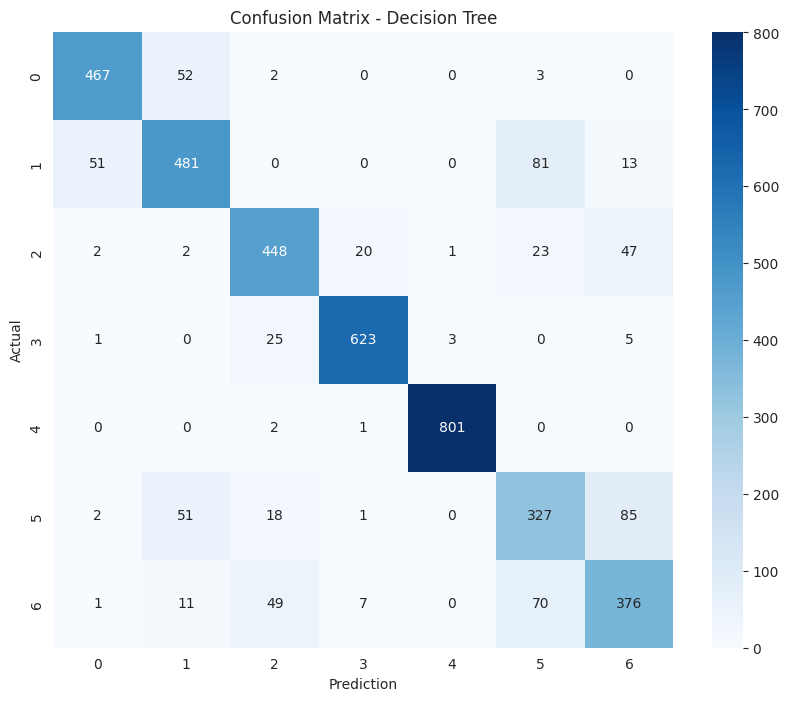

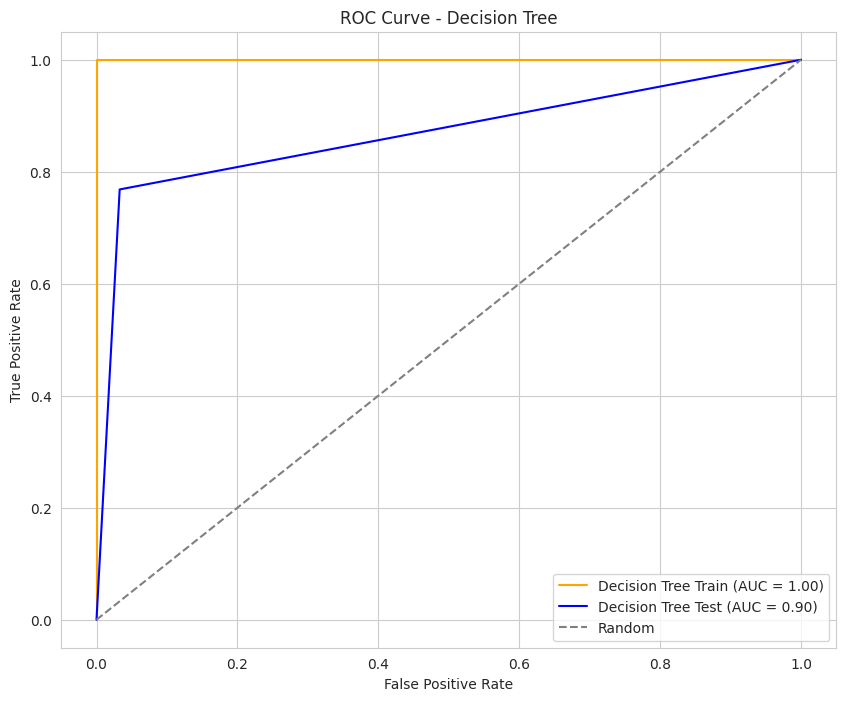


Evaluation Report for Random Forest:

Train ROC AUC: 1.00
Test ROC AUC: 0.99
Train Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1999
           1       1.00      1.00      1.00      2456
           2       1.00      1.00      1.00      2367
           3       1.00      1.00      1.00      2591
           4       1.00      1.00      1.00      3242
           5       1.00      1.00      1.00      1943
           6       1.00      1.00      1.00      2008

    accuracy                           1.00     16606
   macro avg       1.00      1.00      1.00     16606
weighted avg       1.00      1.00      1.00     16606


Test Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.91      0.92       524
           1       0.83      0.88      0.86       626
           2       0.89      0.87      0.88       543
           3       0.97      0.97      0.97       

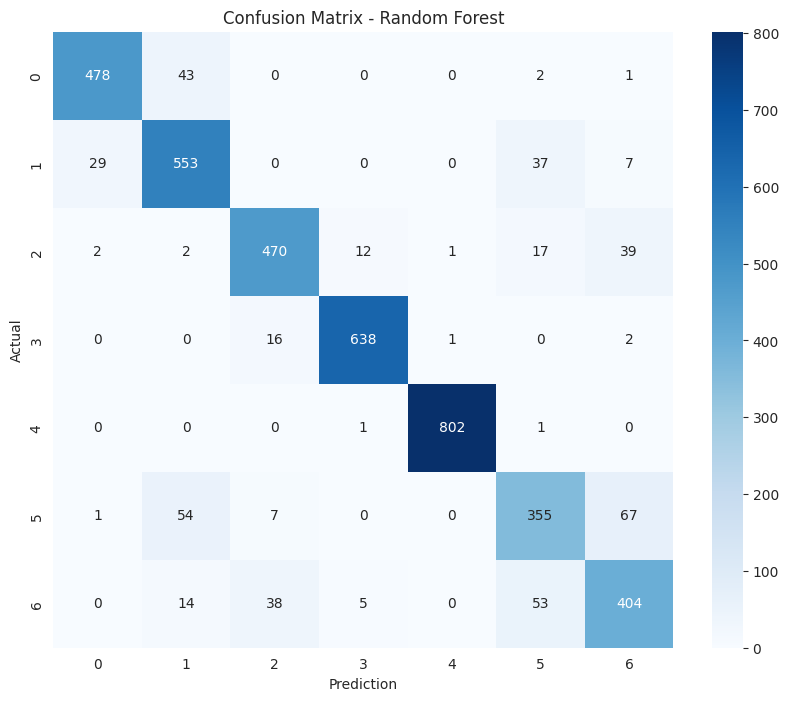

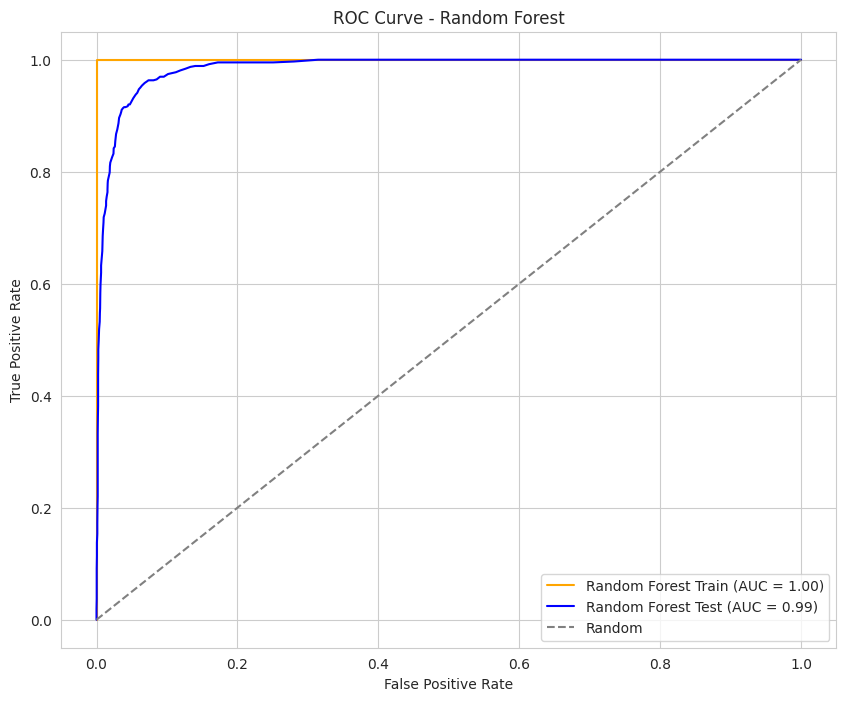


Evaluation Report for AdaBoost:

Train ROC AUC: 0.75
Test ROC AUC: 0.75
Train Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           0       0.56      0.15      0.23      1999
           1       0.39      0.49      0.44      2456
           2       0.29      0.00      0.00      2367
           3       0.39      0.98      0.56      2591
           4       0.00      0.00      0.00      3242
           5       0.49      0.62      0.54      1943
           6       0.43      0.88      0.58      2008

    accuracy                           0.42     16606
   macro avg       0.36      0.44      0.34     16606
weighted avg       0.34      0.42      0.31     16606


Test Classification Report:
              precision    recall  f1-score   support

           0       0.59      0.16      0.26       524
           1       0.41      0.51      0.45       626
           2       0.00      0.00      0.00       543
           3       0.40      0.98      0.57       657
           4       0.00      0.00      0.00       804
           5       0.49      0.61      0.55      

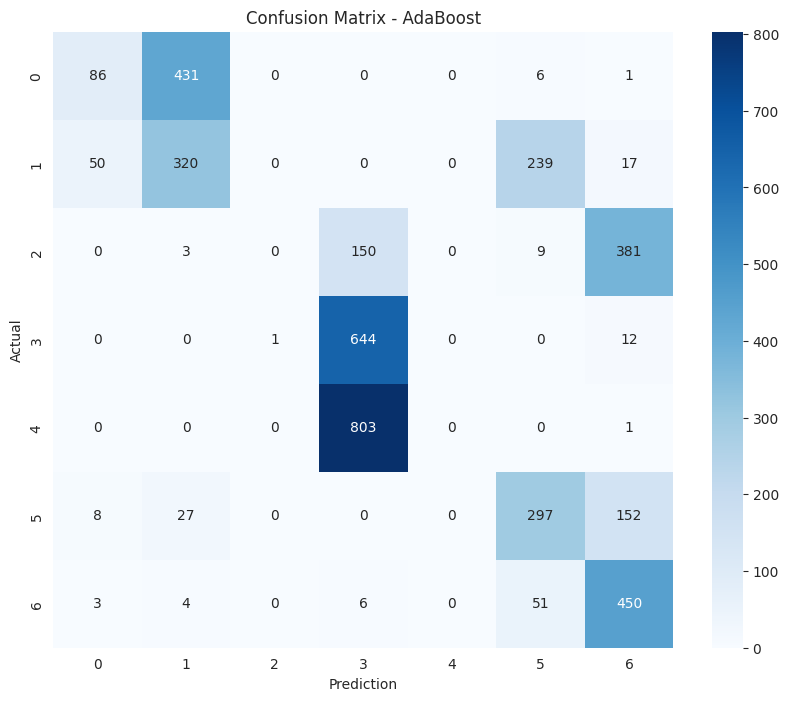

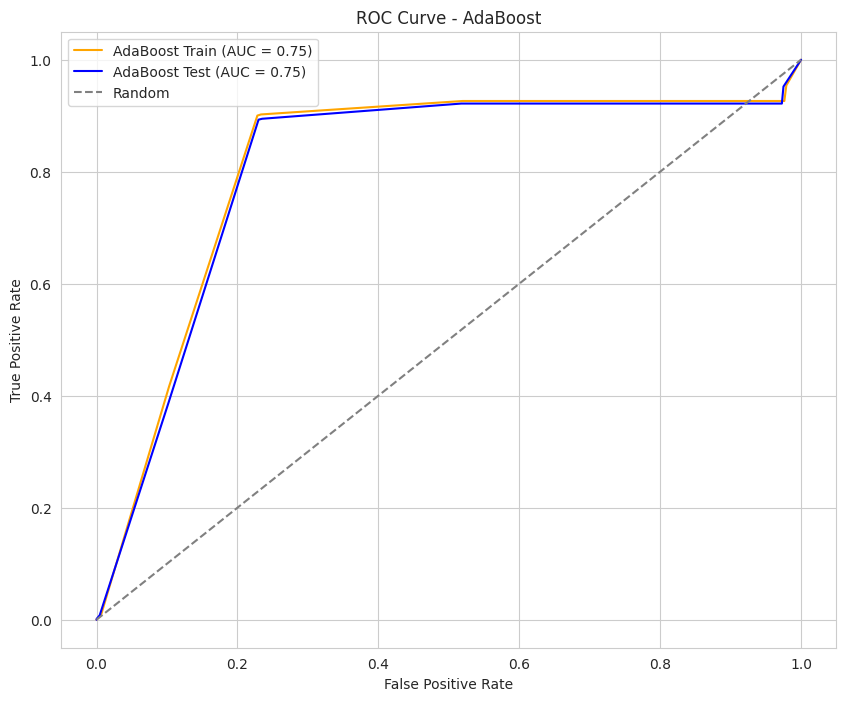


Evaluation Report for Gradient Boosting:

Train ROC AUC: 0.99
Test ROC AUC: 0.99
Train Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      1999
           1       0.89      0.90      0.89      2456
           2       0.92      0.92      0.92      2367
           3       0.97      0.98      0.98      2591
           4       1.00      1.00      1.00      3242
           5       0.84      0.80      0.82      1943
           6       0.84      0.85      0.84      2008

    accuracy                           0.92     16606
   macro avg       0.91      0.91      0.91     16606
weighted avg       0.92      0.92      0.92     16606


Test Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       524
           1       0.88      0.89      0.88       626
           2       0.88      0.88      0.88       543
           3       0.98      0.97      0.97   

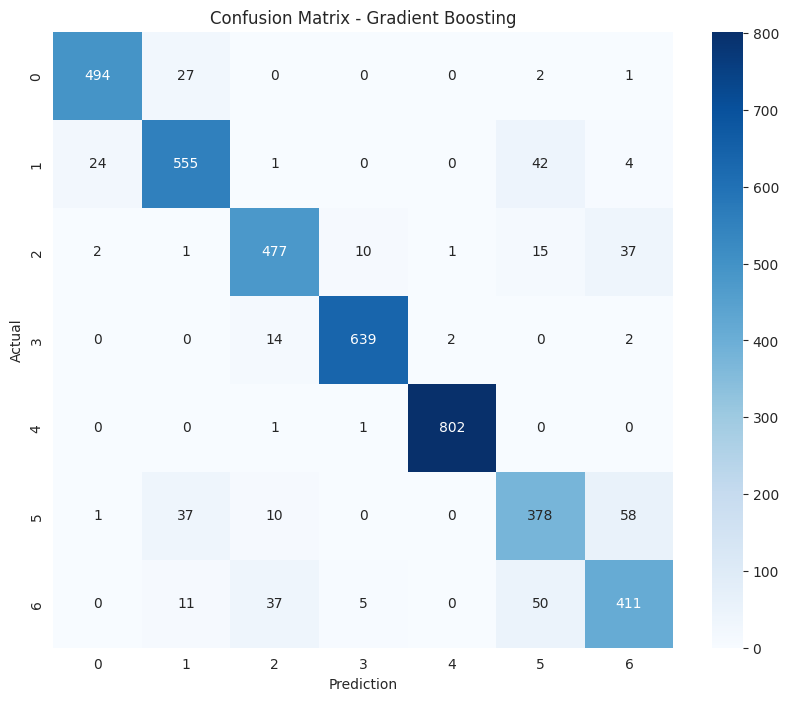

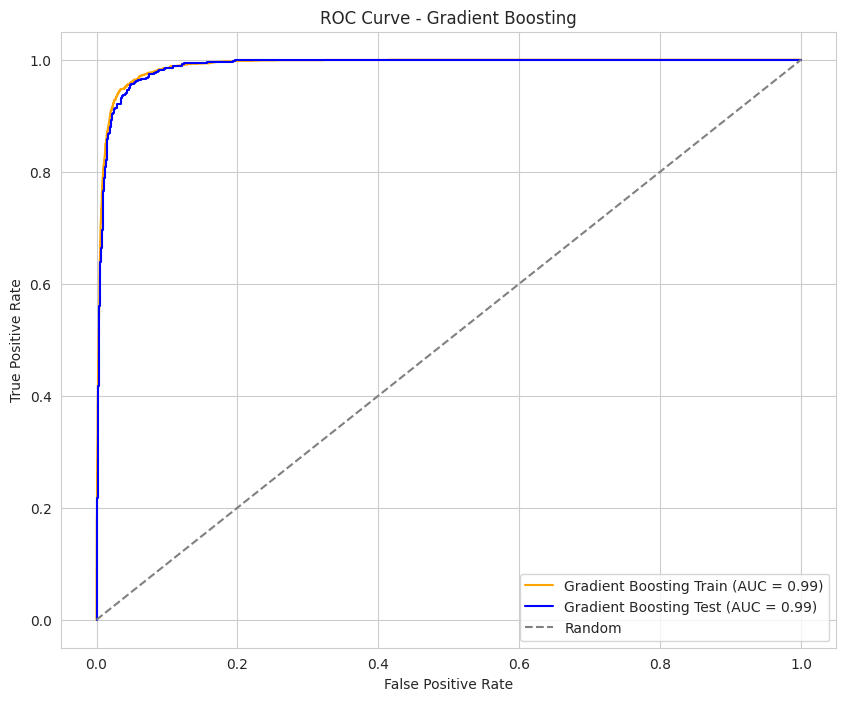


Evaluation Report for XGBoost:

Train ROC AUC: 1.00
Test ROC AUC: 0.99
Train Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1999
           1       0.98      0.98      0.98      2456
           2       0.99      0.99      0.99      2367
           3       1.00      1.00      1.00      2591
           4       1.00      1.00      1.00      3242
           5       0.98      0.96      0.97      1943
           6       0.97      0.98      0.98      2008

    accuracy                           0.99     16606
   macro avg       0.99      0.99      0.99     16606
weighted avg       0.99      0.99      0.99     16606


Test Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.93      0.94       524
           1       0.87      0.88      0.88       626
           2       0.88      0.86      0.87       543
           3       0.97      0.97      0.97       657
  

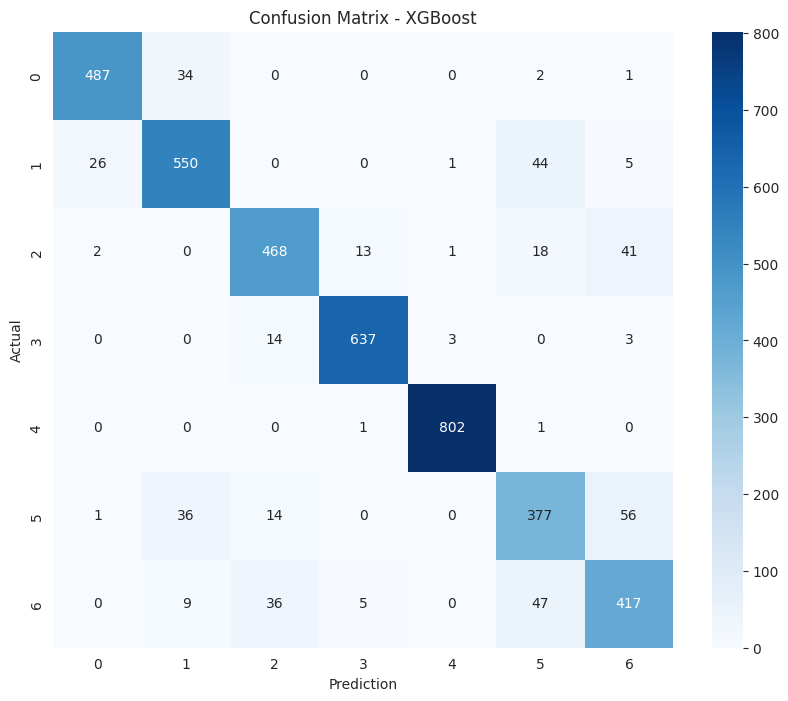

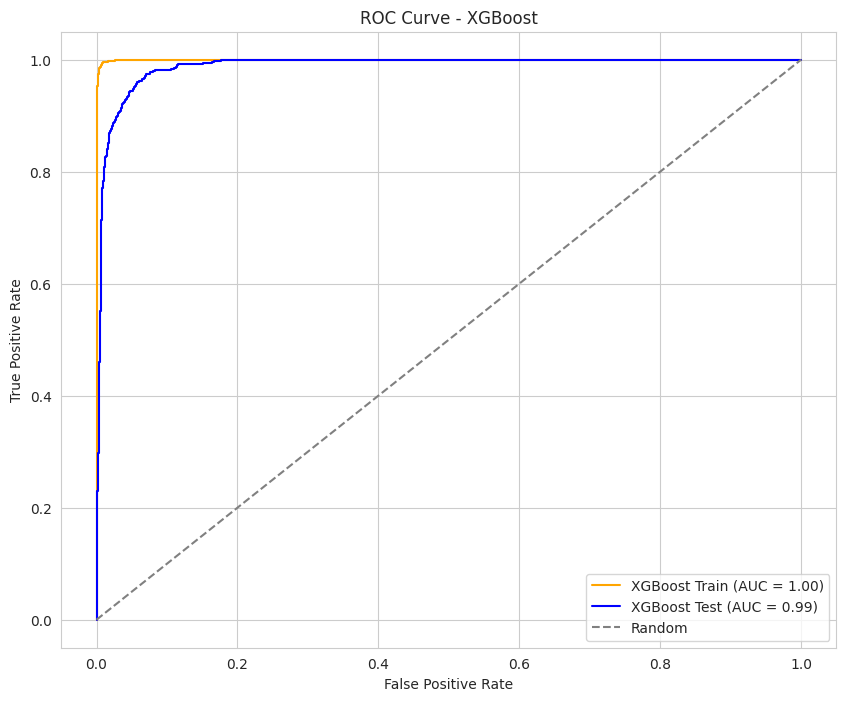


Evaluation Report for CatBoost:

Train ROC AUC: 1.00
Test ROC AUC: 0.99
Train Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1999
           1       0.95      0.96      0.95      2456
           2       0.96      0.95      0.95      2367
           3       0.98      0.99      0.99      2591
           4       1.00      1.00      1.00      3242
           5       0.93      0.89      0.91      1943
           6       0.91      0.93      0.92      2008

    accuracy                           0.96     16606
   macro avg       0.96      0.96      0.96     16606
weighted avg       0.96      0.96      0.96     16606


Test Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.92      0.93       524
           1       0.87      0.88      0.88       626
           2       0.89      0.87      0.88       543
           3       0.98      0.98      0.98       657
 

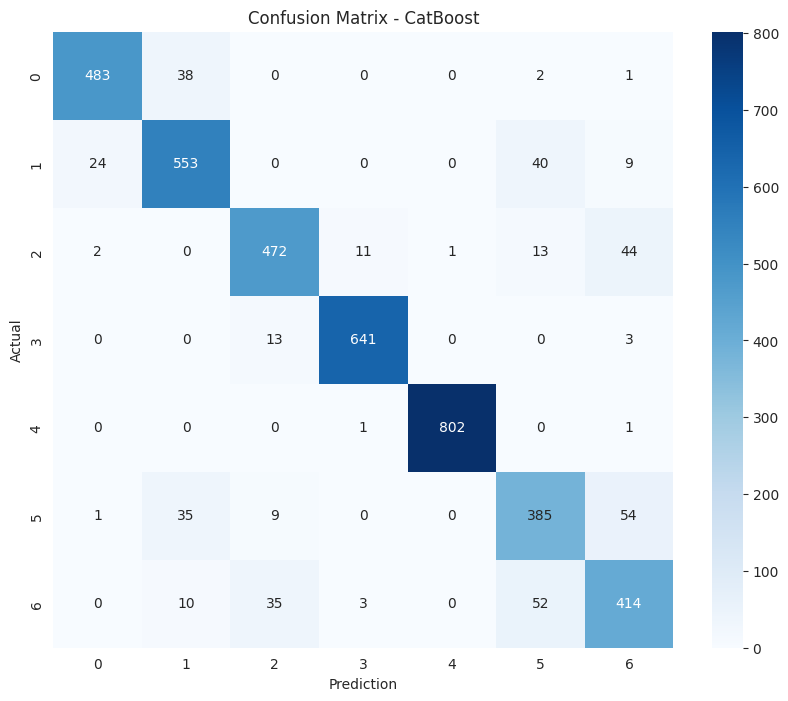

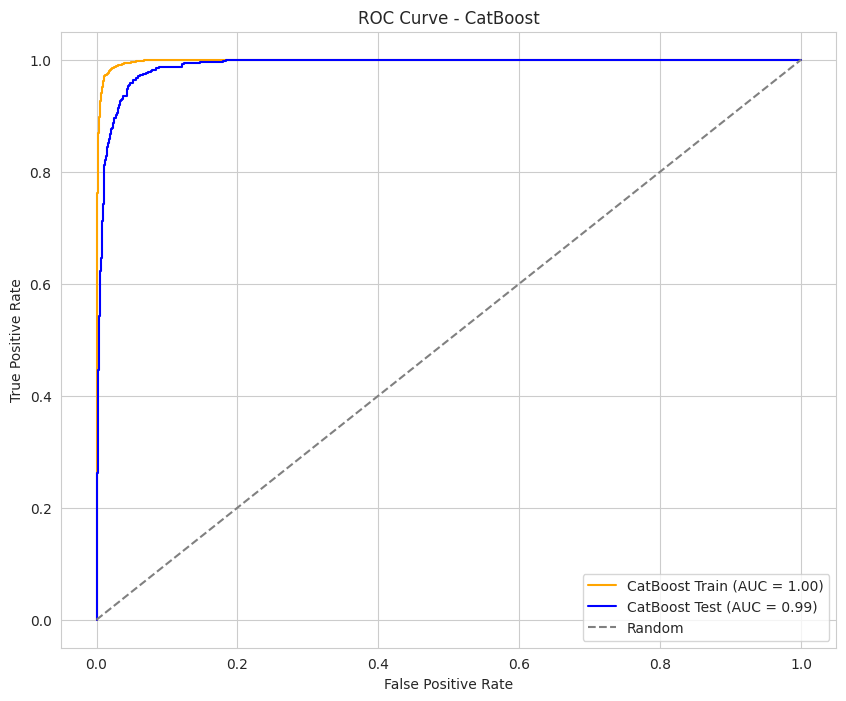

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2050
[LightGBM] [Info] Number of data points in the train set: 16606, number of used features: 21
[LightGBM] [Info] Start training from score -2.117117
[LightGBM] [Info] Start training from score -1.911230
[LightGBM] [Info] Start training from score -1.948141
[LightGBM] [Info] Start training from score -1.857720
[LightGBM] [Info] Start training from score -1.633574
[LightGBM] [Info] Start training from score -2.145531
[LightGBM] [Info] Start training from score -2.112625

Evaluation Report for LGBM:

Train ROC AUC: 1.00
Test ROC AUC: 0.99
Train Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1999
           1       0.97      0.98      0.97      2456
        

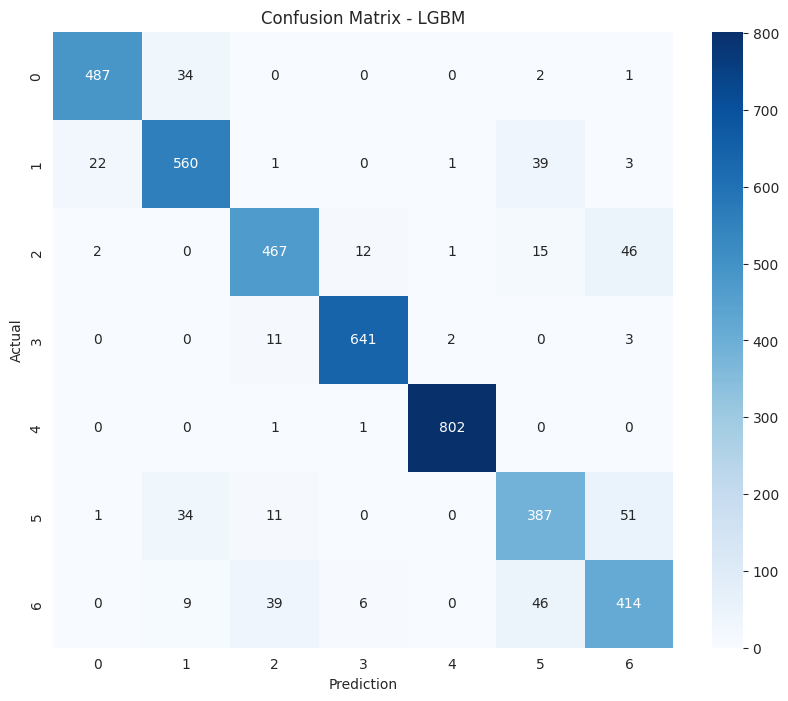

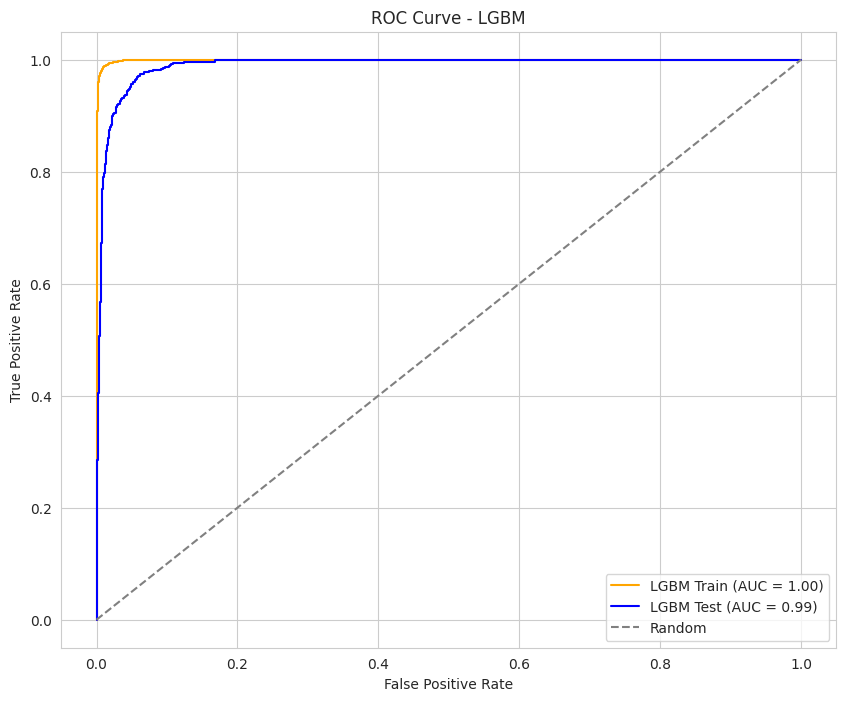

In [24]:
# List of algorithms to be used
algorithms = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'AdaBoost': AdaBoostClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier(),
    'CatBoost': CatBoostClassifier(iterations=1000, verbose=False),  # Set verbose to False
    'LGBM': LGBMClassifier()
}

# Loop for fitting & model evaluation
for algo_name, model in algorithms.items():
    # Fitting the model to the training data
    model.fit(X_train, y_train)

    # Evaluation on training data
    y_train_prob = model.predict_proba(X_train)
    roc_auc_train = roc_auc_score(y_train, y_train_prob, average='macro', multi_class='ovr')

    # Evaluation on test data
    y_test_prob = model.predict_proba(X_test)
    roc_auc_test = roc_auc_score(y_test, y_test_prob, average='macro', multi_class='ovr')

    # Printing evaluation results
    print(f"\nEvaluation Report for {algo_name}:\n")
    print("Train ROC AUC: {:.2f}".format(roc_auc_train))
    print("Test ROC AUC: {:.2f}".format(roc_auc_test))

    # Printing classification results
    print("Train Classification Report:")
    y_train_pred = model.predict(X_train)
    print(classification_report(y_train, y_train_pred))

    print("\nTest Classification Report:")
    y_test_pred = model.predict(X_test)
    print(classification_report(y_test, y_test_pred))

    # Calculating confusion matrix
    confusion_mat = confusion_matrix(y_test, y_test_pred)

    # Creating confusion matrix plot
    plt.figure(figsize=(10, 8))
    sns.heatmap(confusion_mat, annot=True, fmt="d", cmap="Blues",
                xticklabels=model.classes_,
                yticklabels=model.classes_)
    plt.xlabel("Prediction")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {algo_name}")
    plt.show()

    # Plotting ROC Curve for training and testing data in one plot
    fpr_train, tpr_train, _ = roc_curve(y_train, y_train_prob[:, 1], pos_label=model.classes_[1])
    fpr_test, tpr_test, _ = roc_curve(y_test, y_test_prob[:, 1], pos_label=model.classes_[1])

    plt.figure(figsize=(10, 8))
    plt.plot(fpr_train, tpr_train, label=f'{algo_name} Train (AUC = {roc_auc_train:.2f})', color='orange')
    plt.plot(fpr_test, tpr_test, label=f'{algo_name} Test (AUC = {roc_auc_test:.2f})', color='blue')

    plt.plot([0, 1], [0, 1], '--', color='gray', label='Random')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {algo_name}')
    plt.legend()
    plt.show()

The algorithms demonstrating the highest accuracy and ROC AUC curve is **LightGBM**. Therefore, we will proceed with **hyperparameter tuning for LightGBM** to further improve the model's performance.

## Tuning HyperParameter

Best parameters: {'learning_rate': 0.08636946005053343, 'n_estimators': 168, 'max_depth': 7, 'num_leaves': 39, 'subsample': 0.7780681609420372, 'colsample_bytree': 0.4642212871479303, 'min_child_samples': 21}
Classification Report - Training Set
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1999
           1       0.95      0.96      0.96      2456
           2       0.97      0.97      0.97      2367
           3       1.00      1.00      1.00      2591
           4       1.00      1.00      1.00      3242
           5       0.94      0.90      0.92      1943
           6       0.93      0.94      0.93      2008

    accuracy                           0.97     16606
   macro avg       0.97      0.97      0.97     16606
weighted avg       0.97      0.97      0.97     16606

Classification Report - Testing Set
              precision    recall  f1-score   support

           0       0.96      0.94      0.95       524
           1

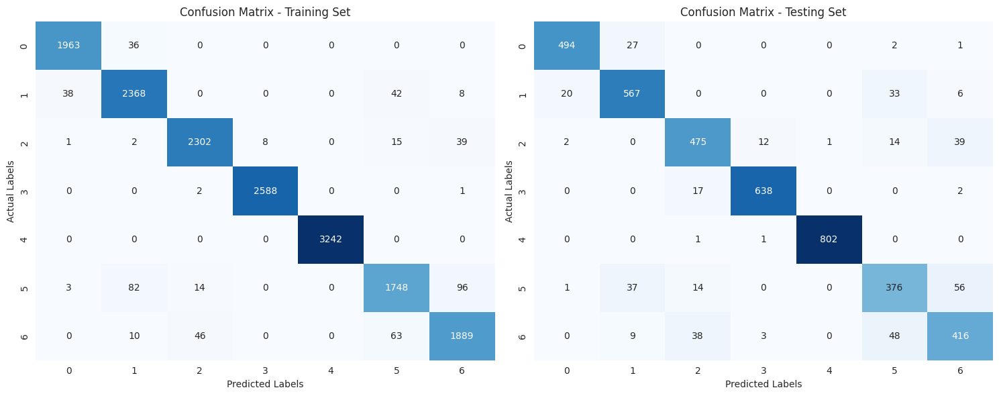

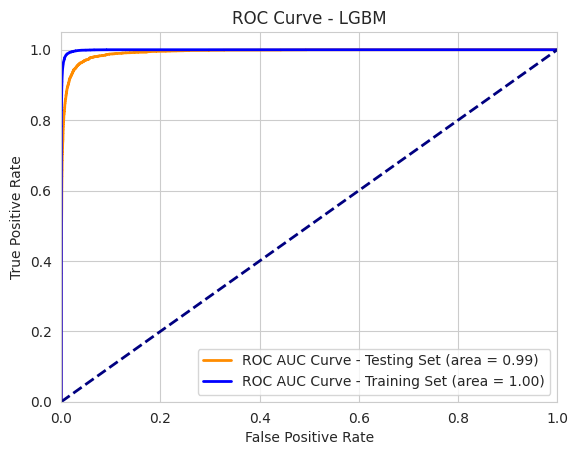

In [25]:
# Set the logging level to WARNING or higher to disable logs from Optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Define the objective function for Optuna with accuracy as the metric
def objective(trial):
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.5),
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'max_depth': trial.suggest_int('max_depth', 3, 7),
        'num_leaves': trial.suggest_int('num_leaves', 20, 50),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.3, 1.0),
        'min_child_samples': trial.suggest_int('min_child_samples', 20, 30),
    }

    # Initialize the OneVsRestClassifier model with LGBMClassifier
    ovr_classifier = OneVsRestClassifier(LGBMClassifier(force_row_wise=True, **params, verbose=-1))

    # Compute cross-validated accuracy
    cv_scores = cross_val_score(ovr_classifier, X_train, y_train, cv=3, scoring='accuracy')

    # Return the mean cross-validated accuracy
    return cv_scores.mean()

# Perform hyperparameter tuning using Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)

# Get the best parameters
best_params = study.best_params
print("Best parameters:", best_params)

# Initialize the OneVsRestClassifier model with LGBMClassifier using the best parameters
ovr_classifier = OneVsRestClassifier(LGBMClassifier(force_row_wise=True, **best_params, verbose=-1))

# Train the model
ovr_classifier.fit(X_train, y_train)

# Predict probabilities
y_train_prob = ovr_classifier.predict_proba(X_train)
y_test_prob = ovr_classifier.predict_proba(X_test)

# Convert the multi-class problem into a binary problem using the "macro" averaging strategy
n_classes = len(np.unique(y_train))
y_train_binary = label_binarize(y_train, classes=range(n_classes))
y_test_binary = label_binarize(y_test, classes=range(n_classes))

# Predictions
y_train_pred = ovr_classifier.predict(X_train)
y_test_pred = ovr_classifier.predict(X_test)

# Confusion matrix
cm_train = confusion_matrix(y_train, y_train_pred)
cm_test = confusion_matrix(y_test, y_test_pred)

# Classification report
print("Classification Report - Training Set")
print(classification_report(y_train, y_train_pred))
print("Classification Report - Testing Set")
print(classification_report(y_test, y_test_pred))

# Compute ROC AUC score
roc_auc_train = roc_auc_score(y_train_binary, y_train_prob, average='macro')
roc_auc_test = roc_auc_score(y_test_binary, y_test_prob, average='macro')

print("ROC-AUC Training:", roc_auc_train)
print("ROC-AUC Testing:", roc_auc_test)

# Plot confusion matrix
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
sns.heatmap(cm_train, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.title('Confusion Matrix - Training Set')
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')

plt.subplot(1, 2, 2)
sns.heatmap(cm_test, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.title('Confusion Matrix - Testing Set')
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')

plt.tight_layout()
plt.show()

# Plot ROC curve for testing set
fpr_test, tpr_test, _ = roc_curve(y_test_binary.ravel(), y_test_prob.ravel())
plt.plot(fpr_test, tpr_test, color='darkorange', lw=2, label='ROC AUC Curve - Testing Set (area = %0.2f)' % roc_auc_score(y_test_binary, y_test_prob, average='macro'))

# Plot ROC curve for training set
fpr_train, tpr_train, _ = roc_curve(y_train_binary.ravel(), y_train_prob.ravel())
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='ROC AUC Curve - Training Set (area = %0.2f)' % roc_auc_score(y_train_binary, y_train_prob, average='macro'))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - LGBM')
plt.legend(loc="lower right")
plt.show()

# Data Testing Predictions

In [26]:
test_data = pd.read_csv('/content/drive/MyDrive/Portofolio/Project/ObesityRisk/Dataset/test.csv')
test_data.head()

,id,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,20758,Male,26.899886,1.848294,120.644178,yes,yes,2.938616,3.000000,Sometimes,no,2.825629,no,0.855400,0.000000,Sometimes,Public_Transportation
1,20759,Female,21.000000,1.600000,66.000000,yes,yes,2.000000,1.000000,Sometimes,no,3.000000,no,1.000000,0.000000,Sometimes,Public_Transportation
2,20760,Female,26.000000,1.643355,111.600553,yes,yes,3.000000,3.000000,Sometimes,no,2.621877,no,0.000000,0.250502,Sometimes,Public_Transportation
3,20761,Male,20.979254,1.553127,103.669116,yes,yes,2.000000,2.977909,Sometimes,no,2.786417,no,0.094851,0.000000,Sometimes,Public_Transportation
4,20762,Female,26.000000,1.627396,104.835346,yes,yes,3.000000,3.000000,Sometimes,no,2.653531,no,0.000000,0.741069,Sometimes,Public_Transportation


In [27]:
test_data.shape

(13840, 17)

In [28]:
test_data2 = test_data.drop(columns=['id'])
test_data2.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,Male,26.899886,1.848294,120.644178,yes,yes,2.938616,3.000000,Sometimes,no,2.825629,no,0.855400,0.000000,Sometimes,Public_Transportation
1,Female,21.000000,1.600000,66.000000,yes,yes,2.000000,1.000000,Sometimes,no,3.000000,no,1.000000,0.000000,Sometimes,Public_Transportation
2,Female,26.000000,1.643355,111.600553,yes,yes,3.000000,3.000000,Sometimes,no,2.621877,no,0.000000,0.250502,Sometimes,Public_Transportation
3,Male,20.979254,1.553127,103.669116,yes,yes,2.000000,2.977909,Sometimes,no,2.786417,no,0.094851,0.000000,Sometimes,Public_Transportation
4,Female,26.000000,1.627396,104.835346,yes,yes,3.000000,3.000000,Sometimes,no,2.653531,no,0.000000,0.741069,Sometimes,Public_Transportation


In [29]:
# Columns that need to be labeled with encoding
binary_columns = ['family_history_with_overweight', 'FAVC', 'SMOKE', 'SCC', 'CAEC', 'CALC']

# Create a LabelEncoder object
label_encoder = LabelEncoder()

# Perform label encoding for each binary column
for column in binary_columns:
    test_data2[column] = label_encoder.fit_transform(test_data2[column])

# Columns that will be one-hot encoding
columns_to_encode = ['Gender','MTRANS']

# Perform one-hot encoding for these columns
test_data2 = pd.get_dummies(test_data2, columns=columns_to_encode)
test_data2.head()

,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,Gender_Female,Gender_Male,MTRANS_Automobile,MTRANS_Bike,MTRANS_Motorbike,MTRANS_Public_Transportation,MTRANS_Walking
0,26.899886,1.848294,120.644178,1,1,2.938616,3.000000,2,0,2.825629,0,0.855400,0.000000,2,0,1,0,0,0,1,0
1,21.000000,1.600000,66.000000,1,1,2.000000,1.000000,2,0,3.000000,0,1.000000,0.000000,2,1,0,0,0,0,1,0
2,26.000000,1.643355,111.600553,1,1,3.000000,3.000000,2,0,2.621877,0,0.000000,0.250502,2,1,0,0,0,0,1,0
3,20.979254,1.553127,103.669116,1,1,2.000000,2.977909,2,0,2.786417,0,0.094851,0.000000,2,0,1,0,0,0,1,0
4,26.000000,1.627396,104.835346,1,1,3.000000,3.000000,2,0,2.653531,0,0.000000,0.741069,2,1,0,0,0,0,1,0


In [30]:
# Predictions on processed test data
y_test_pred = ovr_classifier.predict(test_data2)

# Create a DataFrame for prediction results
predicted_data_test = pd.DataFrame({'NObeyesdad': y_test_pred})
predicted_data_test.insert(0, 'id', test_data['id'])

predicted_data_test.head()

,id,NObeyesdad
0,20758,3
1,20759,5
2,20760,4
3,20761,2
4,20762,4


In [31]:
# A dictionary that maps each target value to its new values
target_mapping = {
    0: 'Insufficient_Weight',
    1: 'Normal_Weight',
    2: 'Obesity_Type_I',
    3: 'Obesity_Type_II',
    4: 'Obesity_Type_III',
    5: 'Overweight_Level_I',
    6: 'Overweight_Level_II'
}
# Use the map method to change the values ​​in the target column
predicted_data_test['NObeyesdad'] = predicted_data_test['NObeyesdad'].map(target_mapping)
predicted_data_test.head()

,id,NObeyesdad
0,20758,Obesity_Type_II
1,20759,Overweight_Level_I
2,20760,Obesity_Type_III
3,20761,Obesity_Type_I
4,20762,Obesity_Type_III


In [32]:
# Saves the predicted DataFrame into a CSV file
predicted_data_test.to_csv('submission.csv', index=False)

In [33]:
files.download('submission.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>